###

### Data Handling and Loading Configuration and Images


###

In [1]:
# Importazioni standard di librerie Python

import random  # Per operazioni randomiche (seed, shuffle, ecc.)
from collections import Counter  # Conta la frequenza di elementi (classi, ecc.)
from pathlib import Path  # Gestione percorsi file in modo portabile
import os

# Librerie per data augmentation, visualizzazione, metriche, ecc

#import albumentations as A  # Augmentation di immagini
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd  # Gestione tabelle e DataFrame
from albumentations.pytorch import ToTensorV2  # Conversione immagini in tensor PyTorch
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix  # Matrici di confusione per valutazione
from sklearn.model_selection import StratifiedKFold  # Cross validation stratificata
from torch.utils.data import DataLoader  # Caricamento dati in batch per PyTorch
from torchinfo import summary  # Stampa architettura dettagliata dei modelli PyTorch
import os
from pathlib import Path

# Importa mapping tra etichette e nomi, e liste di dati (file/data_list.py)
from data_list_alberto import num2strig, strig2num, test_sources, tot_list

# Dal modulo data_loader.py: classi e funzioni per dataset e split
from utils.data_loader import (
    BalancedDataLoader,  # DataLoader bilanciato per evitare sbilanciamenti tra classi
    Mosaico_dataset,     # Classe dataset custom per le immagini delle zanzare
    get_data_from_file_list,  # Carica dati da una lista di file
    num2string,          # Mapping da indice numerico a stringa
    split_data_by_source # Splitta dati in base alla sorgente (es. sito di raccolta)
)

# Dal modulo figures.py: funzioni di visualizzazione e plotting

from utils.figures import (
    ROC,                 # Plot ROC curve per valutazione binaria/multiclasse
    ROC_unknown,         # Plot ROC curve per classi "unknown"
    display_image_grid,  # Mostra un grid di immagini del dataset
    plot_history,        # Plotta andamento loss/accuracy durante il training
    species_sources_Table, # Visualizza tabella specie/sorgenti
    visualize_augmentations # Visualizza immagini dopo augmentation
)


# Dal modulo losses_metrics.py: metriche custom
from utils.losses_metrics import (
    macro_acc,           # Macro accuracy (valuta media accuracy sulle classi)
    micro_acc            # Micro accuracy (valuta accuracy complessiva)
)


# Dal modulo models.py: funzione di training del modello
#from utils.models import MOSAICO_training  # Funzione per addestrare il modello MOSAICO

work_dir = Path(os.environ["WORK"])
home_dir = Path(os.environ["HOME"])
dataset = "Tot_Field_dataset"
absolute_path = work_dir / "Mattia_Liguoro_final_project"
table_path = absolute_path / dataset / "Table.xlsx"
print(table_path)  # Verifica il percorso


/leonardo/prod/opt/libraries/cineca-ai/4.3.0/none/cineca-ai-env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/leonardo/prod/opt/libraries/cineca-ai/4.3.0/none/cineca-ai-env/lib/python3.11/site-packages/transformers/utils/generic.py:462: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


/leonardo_work/tra25_sapi_ml/Mattia_Liguoro_final_project/Tot_Field_dataset/Table.xlsx


In [2]:
one_dataset = True
old_in_val = False
n_classi = 15
n_generi = 4

work_dir = Path(os.environ["WORK"])
dataset = "Tot_Field_dataset"
absolute_path = work_dir / "Mattia_Liguoro_final_project"# "all" indica che si è usato tutto il data set per il training/vali, usando per il test set una cartella apparte
# "split" indica che si è usato lo stesso dataset per train/vali e test
results_folder = "effnetm_mEDL_split_seq_all_7class_4"  #effnetm_uncert_split_seq_all_7class

dataset = "Tot_Field_dataset"
data_path = absolute_path / dataset / "Data"
table_path = absolute_path / dataset / "Table.xlsx"
Table = pd.read_excel(table_path, sheet_name=0)

old_dataset = "ISS_dataset"
old_path = absolute_path /old_dataset / "Data"
old_table_path = absolute_path /old_dataset / "Table.xlsx"
Table_old = pd.read_excel(old_table_path)

#species_sources_Table(table_path, data_path)   # DA MODIFICARE
# Se testiamo su un'altro dataset in un'altra cartella, uso one_dataset = False
if not one_dataset:
    test_dataset = "Test_Field_dataset"
    test_data_path = absolute_path /test_dataset / "Data"
    test_table_path = absolute_path /test_dataset / "Table.xlsx"
    Table_test = pd.read_excel(test_table_path, sheet_name=0)
    species_sources_Table(test_table_path, test_data_path)   # DA MODIFICARE

In [3]:
# ================================
#     Parametri generali
# ================================
params = {
    "device": "cuda:0",
    "batch_size": 8,
    "num_workers": 4, # prima era 2
    "dropout": 0.2,
    "lambdaL2": 5e-5,
    "training_method": 'm-EDL',
    "n_classes": n_classi,
    "n_genus": n_generi, 
    "strig2num": strig2num,
    "model_type": "convnextv2_small",
}

# ================================
#   Trasformazioni Albumentations
# ================================
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Mean / std di ImageNet
imagenet_mean = (0.485, 0.456, 0.406)
imagenet_std  = (0.229, 0.224, 0.225)

IMG_SIZE = 384 #256             # da 256 → 384
MAX_LONG_EDGE = 480        # lato lungo iniziale

# -------------------- TRAIN --------------------
train_transform = A.Compose([
    # Ridimensiona lato lungo a 480 px
    A.LongestMaxSize(max_size=MAX_LONG_EDGE, interpolation=cv2.INTER_LINEAR),

    # Se l’immagine dopo il ridimensionamento precedente non raggiunge 384×384, aggiunge bordo nero (valore (0,0,0)) fino a raggiungere quella dimensione
    A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE,
                  border_mode=cv2.BORDER_CONSTANT, value=(0, 0, 0)),

    # Effettua un crop casuale dell’immagine, di area (tra il 35% e il 80% dell’area totale) e poi il crop viene ridimensionato a 384×384.
     A.RandomResizedCrop(height=IMG_SIZE, width=IMG_SIZE,
                        scale=(0.7, 1.0),      
                        ratio=(0.8, 1.25),              
                        interpolation=cv2.INTER_LINEAR, p=1.0),

    #Rotazioni multiple di 90°
    A.RandomRotate90(p=0.5),

    #Distorsioni geometriche
    A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.2),
    A.OpticalDistortion(distort_limit=0.2, shift_limit=0.2, p=0.2),
    A.Affine(shear=(-12, 12), p=0.3),
    A.Perspective(scale=(0.05, 0.15), p=0.2),
    A.ElasticTransform(alpha=1.0, sigma=50, alpha_affine=50,
                       interpolation=cv2.INTER_LINEAR,
                       border_mode=cv2.BORDER_CONSTANT, value=(0, 0, 0), p=0.1),
    
    #Flip / rotazioni più piccole
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.10, scale_limit=0.15, rotate_limit=30,
                       border_mode=cv2.BORDER_CONSTANT, value=(0, 0, 0), p=0.5),


    # Variazioni cromatiche
    A.HueSaturationValue(hue_shift_limit=20,
                         sat_shift_limit=30,
                         val_shift_limit=20, p=0.4),
    A.RGBShift(r_shift_limit=20, g_shift_limit=20, b_shift_limit=20, p=0.3),
    A.ChannelShuffle(p=0.1),
    A.ColorJitter(brightness=0.25, contrast=0.25,
                  saturation=0.25, hue=0.0, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.25,
                               contrast_limit=0.25, p=0.5),

    # Rumore / blur / compressione JPEG
    A.GaussNoise(var_limit=(10.0, 40.0), p=0.25),
    A.GaussianBlur(blur_limit=(3, 11), p=0.25),
    A.MotionBlur(blur_limit=9, p=0.15),
    A.ImageCompression(quality_lower=40, quality_upper=90, p=0.2),

    # CLAHE, dropout, sharpen, gamma
    A.CLAHE(clip_limit=2.0, tile_grid_size=(8, 8), p=0.1), # utile per migliorare il contrasto locale nelle immagini
    A.CoarseDropout(max_holes=5,                       #  Simula la cancellazione di pezzi casuali dell’immagine ("dropout" visivo), utile per rendere il modello robusto a parti mancanti o oggetti coperti.
                    max_height=int(0.10 * IMG_SIZE),   
                    max_width=int(0.10 * IMG_SIZE),
                    min_holes=1,
                    min_height=int(0.04 * IMG_SIZE),
                    min_width=int(0.04 * IMG_SIZE),
                    fill_value=(0, 0, 0), p=0.30),
    A.Sharpen(alpha=(0.25, 0.45), lightness=(0.8, 1.2), p=0.25),
    A.RandomGamma(gamma_limit=(70, 130), p=0.15),

    # 11) Resize finale + normalizzazione
    A.Resize(IMG_SIZE, IMG_SIZE, interpolation=cv2.INTER_LINEAR, always_apply=True),
    A.Normalize(mean=imagenet_mean, std=imagenet_std),
    ToTensorV2(),
])


# -------------------- VALIDATION --------------------
val_transform = A.Compose([
    A.LongestMaxSize(max_size=MAX_LONG_EDGE, interpolation=cv2.INTER_LINEAR),
    A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE,
                  border_mode=cv2.BORDER_CONSTANT, value=(0, 0, 0)),
    A.CenterCrop(height=IMG_SIZE, width=IMG_SIZE),
    A.Normalize(mean=imagenet_mean, std=imagenet_std),
    ToTensorV2(),
])



In [4]:
# Divisione train_test_set, da non toccare
seed_value = 42
random.seed(seed_value)

species_list = tot_list[:n_classi]  # Lista delle specie note (primi n_classi elementi della lista totale)
unknown_list = tot_list[n_classi:]  # Tutto ciò che rimane viene considerato "unknown" (esemplari etichettati solo a livello di genere)
print(species_list)
print(unknown_list)

result_path = absolute_path /dataset / "results"
results_folder_path = absolute_path /result_path / results_folder
result_path.mkdir(parents=True, exist_ok=True)
results_folder_path.mkdir(parents=True, exist_ok=True)
if one_dataset:
    train_files, test_files, report_train, report_test = split_data_by_source(table_path, species_list, test_sources)
    if params["training_method"] == 'm-EDL':
        train_unknown_files,test_unknown_files,report_unknown_train, report_unknown_test = split_data_by_source(table_path, unknown_list, test_sources)
        train_files.extend(train_unknown_files)
        test_files.extend(test_unknown_files)
        report_train.update(report_unknown_train)
        report_test.update(report_unknown_test)
    test_data_path = data_path
else:
    train_files = list(data_path.glob("*.npz"))
    sources_train = Table["source"].values
    report_train = np.unique(sources_train)
    test_files = list(test_data_path.glob("*.npz"))
    sources_test = Table_test["source"].values
    report_test = np.unique(sources_test)

tot_target_train = 0
tot_unknown_train = 0
print("Sources used during training:")
for key, value in report_train.items():
    print(f"{key}: {value}")
    if key in species_list:
        tot_target_train += value[-1]
    else:
        tot_unknown_train += value[-1]

print()

tot_target_test = 0
tot_unknown_test = 0
print("Sources used during test:")
for key, value in report_test.items():
    print(f"{key}: {value}")
    if key in species_list:
        tot_target_test += value[-1]
    else:
        tot_unknown_test += value[-1]

print()
print(params["strig2num"])
print()
print(f'Numero di classi: {params["n_classes"]}')

np.savez(results_folder_path / "train_test_split_files.npz", train_files = train_files, test_files = test_files, \
            report_train = report_train, report_test = report_test, params = params)

['Aedes aegypti', 'Aedes albopictus', 'Aedes caspius', 'Aedes koreicus', 'Anopheles maculipennis', 'Culex pipiens', 'Aedes vexans', 'Culiseta longiareolata', 'Culex theileri', 'Aedes geniculatus', 'Aedes mariae', 'Culex hortensis', 'Anopheles algeriensis', 'Aedes rusticus', 'Aedes detritus']
[]
Sources used during training:
Aedes aegypti: (['Bangkok', 'Brasile', 'Ecuador', 'ISS', 'Sconosciuta', 'Università degli Studi di Milano', 'Vietnam'], 947)
Aedes albopictus: (['Bigarello,provincia di Mantova', 'Grottaglie, Brindisi', 'ISS', 'IZS Lombardia', 'IZS Umbria e Molise', 'Mezzolombardo, provincia di Trento (TN)', 'Roma', "San Michele all' Adige", "San Michele all' Adige, provincia di Trento (TN)", 'Sconosciuta_3', 'Università di Pavia'], 865)
Aedes caspius: (['Alluvioni Piovera', 'Gattinara', 'Grosseto', 'Oristano', 'Palau'], 815)
Aedes koreicus: (['Canal San Bovo (TN)', "San Michele all' Adige, provincia di Trento (TN)", 'Università degli Studi di Milano'], 748)
Anopheles maculipennis: 

###

### Old data from ISS , only 5 species

###

In [5]:
# prima facevo skf per old_vs_new e sss per old_vs_old

# Prepara la lista dei file .npz del vecchio dataset (ISS_dataset) che appartengono alle specie "note"
old_files = Table_old[Table_old["species"].isin(species_list)]["file"].apply(lambda x: "{}{}".format(x,".npz")).values

# Carica le immagini (X_old) e le etichette (old_labels) dai file selezionati nel vecchio dataset
X_old, _, old_labels = get_data_from_file_list(old_path, old_files)

# Traduce le etichette da stringa a indice numerico usando il mapping strig2num
y_old = np.array([strig2num[d['species']] for d in old_labels])

In [6]:
print(np.unique(y_old))
# Costruisce un dizionario che conta quante immagini ci sono per ogni specie nelle vecchie immagini
old_dict = {}
for species in np.unique(y_old):
    old_dict[num2strig[species]] = (y_old == species).sum()

print("Training data prima del merging: (qui non è ancora stato diviso tra known e unknown)")
print(report_train)

# Prepara un riepilogo di quanti esemplari di ciascuna specie (e unknown) ci sono nel training set
train_dict = {}
for species in strig2num:
    if species in species_list:
        train_dict[species] = report_train[species][1]  # Quanti nel nuovo dataset
        if species in old_dict:
            train_dict[species] = train_dict[species] + old_dict[species]  # Somma anche i vecchi dati (ISS_dataset)

# Stampa riepiloghi di cosa viene aggiunto e cosa c'è nel training
print("Old data added in training:")
print(old_dict)
print()
print("Training data:")
print(train_dict)

[0 1 3 5]
Training data prima del merging: (qui non è ancora stato diviso tra known e unknown)
{'Aedes aegypti': (['Bangkok', 'Brasile', 'Ecuador', 'ISS', 'Sconosciuta', 'Università degli Studi di Milano', 'Vietnam'], 947), 'Aedes albopictus': (['Bigarello,provincia di Mantova', 'Grottaglie, Brindisi', 'ISS', 'IZS Lombardia', 'IZS Umbria e Molise', 'Mezzolombardo, provincia di Trento (TN)', 'Roma', "San Michele all' Adige", "San Michele all' Adige, provincia di Trento (TN)", 'Sconosciuta_3', 'Università di Pavia'], 865), 'Aedes caspius': (['Alluvioni Piovera', 'Gattinara', 'Grosseto', 'Oristano', 'Palau'], 815), 'Aedes koreicus': (['Canal San Bovo (TN)', "San Michele all' Adige, provincia di Trento (TN)", 'Università degli Studi di Milano'], 748), 'Anopheles maculipennis': (['Novara (NO), Piemonte', "Sant'Angelo Lomellina, provincia di Pavia (PV), Lombardia", 'Trino provincia di Vercelli (VC), Piemonte', 'Vespolate'], 699), 'Culex pipiens': (['Casalgrande', 'Cortefranca', 'Forlanini', 

In [7]:
from sklearn.model_selection import train_test_split

labels = species_list  # Inizializza la lista delle etichette con le sole specie note

if one_dataset:
    # Se si usa un solo dataset (train/test dallo stesso pool), carica i file train/test e i parametri dallo split già salvato su disco
    with np.load(results_folder_path / "train_test_split_files.npz", allow_pickle=True) as loaded_file:
        train_files = loaded_file["train_files"]  # File di training
        test_files = loaded_file["test_files"]    # File di test
        params = loaded_file["params"].item()     # Parametri usati nello split (ricaricati per coerenza)
        strig2num = params["strig2num"]           # Mapping aggiornato da stringhe a numeri
else:
    # Se i dataset sono separati, si prendono tutti i file .npz dai DataFrame delle tabelle
    train_files = Table["file"].apply(lambda x: "{}{}".format(x,".npz")).values
    test_files = Table_test["file"].apply(lambda x: "{}{}".format(x,".npz")).values

# Carica i dati (immagini e label) dei file selezionati per train e test
X_train, _, train_labels = get_data_from_file_list(data_path, train_files)
X_test_tot, _, test_labels_tot = get_data_from_file_list(test_data_path, test_files)

# Traduce le label da stringa (es. "Aedes") a numero, secondo il mapping strig2num
y_train = np.array([strig2num[d['species']] for d in train_labels])
y_test_tot = np.array([strig2num[d['species']] for d in test_labels_tot])

#species_map = {idx: name for name, idx in params["strig2num"].items()}

#genus_labels_test = labels_to_genus_ids(y_test_tot, species_map)

# Supponiamo di voler usare il 20% dei dati per la validation
val_size = 0.20
random_state = 42  # per riproducibilità

# Divide X_train e y_train in X_train_split, X_val, y_train_split, y_val
X_train_split, X_val, y_train_split, y_val = train_test_split(
    X_train,
    y_train,
    test_size=val_size,
    stratify=y_train,
    random_state=random_state
)

#genus_labels_train = labels_to_genus_ids(y_train_split, species_map)
#genus_labels_val = labels_to_genus_ids(y_val, species_map)


In [8]:
#Faccio un resize delle vecchie immagini dell'ISS con l'obbiettivo di ampliare il mio dataset
#Disclaimer: le foto non sono state fatte con lo stesso dispositivo tantomeno con le stesse condizioni, usiamole come una sorta di data augmentation
# in più abbiamo solo 4 specie: 0, 1, 3 e 5 (vedi dizionario sopra specie: label)

H, W = X_train_split.shape[1], X_train_split.shape[2]
H_old, W_old = X_old.shape[1], X_old.shape[2]

if H_old < H or W_old < W:
    raise ValueError("X_old è più piccolo di X_train_split – impossibile fare crop centrato")

top  = (H_old - H) // 2
left = (W_old - W) // 2
bottom = top + H
right  = left + W
X_old_cropped = X_old[:, top:bottom, left:right].astype(X_train_split.dtype)

# Debug prints
print("X_old shape        :", X_old.shape)
print("X_train_split shape:", X_train_split.shape)
print("X_old cropped shape:", X_old_cropped.shape)
print("Lunghezza vecchi label:", y_old.shape)

# Concatenazione
X_train_split = np.concatenate((X_train_split, X_old_cropped), axis=0)
y_train_split = np.concatenate((y_train_split, y_old), axis=0)

print("X_train_split finale:", X_train_split.shape)
print("y_train_split finale:", y_train_split.shape)
assert X_train_split.shape[0] == y_train_split.shape[0]


X_old shape        : (3050, 512, 512, 3)
X_train_split shape: (5506, 459, 463, 3)
X_old cropped shape: (3050, 459, 463, 3)
Lunghezza vecchi label: (3050,)
X_train_split finale: (8556, 459, 463, 3)
y_train_split finale: (8556,)


###

### Datasets and Dataloaders 

###

In [9]:
# Crea i dataset PyTorch con le rispettive transformazioni 

train_dataset = Mosaico_dataset(X_train_split, y_train_split, transform=train_transform)
val_dataset   = Mosaico_dataset(X_val, y_val, transform=val_transform)
test_dataset  = Mosaico_dataset(X_test_tot, y_test_tot, transform=val_transform)

print("Train dataset size:", len(train_dataset))
print("Validation dataset size:", len(val_dataset))
print("Test dataset size:", len(X_test_tot))

# BalancedDataLoader permette di mantenere il dataset bilanciato pescando i campioni più "rari" con una frequenza maggiore
train_loader = BalancedDataLoader(
        train_dataset,
        batch_size=params["batch_size"],
        shuffle=True,
        num_workers=params["num_workers"],
    )

# Standard DataLoader per validation e test (no shuffling)
val_loader = DataLoader(
        val_dataset,
        batch_size=params["batch_size"],
        shuffle=False,
        num_workers=params["num_workers"],
    )

test_loader = DataLoader(
        test_dataset,
        batch_size=params["batch_size"],
        shuffle=False,
        num_workers=params["num_workers"],
    )

Train dataset size: 8556
Validation dataset size: 1377
Test dataset size: 1781


In [10]:
from typing import Dict
import torch 

def labels_to_genus_ids(
    labels: torch.Tensor,
    species_map: Dict[int, str]
) -> torch.Tensor:
    """
    Converte un tensore di etichette di specie (0-14) in un tensore corrispondente di ID di genere.

    Parameters
    ----------
    labels : torch.Tensor
        Tensore di interi (ad es. shape (N,)) contenente indici di specie
        che devono tutti comparire come chiavi in `species_map`.
    species_map : Dict[int, str]
        Dizionario che mappa ogni indice di specie (int) al nome scientifico corrispondente
        (es. {0: 'Aedes aegypti', 1: 'Aedes albopictus', …}).

    Returns
    -------
    torch.Tensor
        Tensore di interi (stessa shape di `labels`) in cui ogni valore è l’ID numerico
        del genere corrispondente alla specie originale. Gli ID di genere vanno da 0 a G-1,
        dove G è il numero di generi diversi incontrati in `species_map`, ordinati
        per prima apparizione dell’indice di specie.

    """

    # 1. Costruisci, in ordine di indice di specie, la lista dei generi distinti
    #    Es. specie = "Aedes aegypti" → genere = "Aedes"
    genus_seen = []
    for idx in sorted(species_map.keys()): # Scorre tutti gli indici delle specie, ordinati per valore
        full_name = species_map[idx] # mi prende genere e specie dell'elemento idx del dizionario
        genus = full_name.split()[0] # Crea una lista genus_seen dei generi incontrati (senza duplicati), nell’ordine di apparizione degli indici.
        if genus not in genus_seen: 
            genus_seen.append(genus)

    # 2. Mappa ogni genere a un ID numerico
    #    (“Aedes” → 0, “Anopheles” → 1, “Culex” → 2, “Culiseta” → 3, …)
    genus_to_id = {g: i for i, g in enumerate(genus_seen)} #crea un dizionario sui generi visti prima 

    # 3. Costruisci un dizionario che mappa ogni indice di specie all’ID del suo genere
    #    (es. 0 → genus_to_id["Aedes"], 4 → genus_to_id["Anopheles"], ecc.)
    
    species_to_genus_id = {}
    
    for idx, full_name in species_map.items(): #Per ogni specie, ricava il genere e trova il suo ID.
        genus = full_name.split()[0]
        species_to_genus_id[idx] = genus_to_id[genus]

    # 4. Verifica che tutti i valori di `labels` siano chiavi valide in `species_map`
    unique_labels = torch.unique(labels).tolist() 
    for lab in unique_labels:
        if lab not in species_map:
            raise KeyError(f"L'etichetta di specie {lab} non è presente in species_map.")

    # 5. Costruisci un tensore di lookup: mapping_tensor[i] = genus_id per la specie i
    max_label = max(species_map.keys())
    # Creiamo un tensore sullo stesso device e tipo di labels, ma con dtype int,
    # di lunghezza max_label+1, e popolato con l’ID di genere corretto
    mapping_tensor = torch.empty(max_label + 1, dtype=torch.int, device=labels.device)
    for i in range(max_label + 1):
        # Se non esiste una specie_map[i], l’interazione al passo 4 protegge già dall’errore
        mapping_tensor[i] = species_to_genus_id[i]

    # 6. Indicizzi il lookup con il tensore di etichette e restituisci
    return mapping_tensor[labels] #Restituisce un tensore dove ogni etichetta specie in labels è sostituita con il suo corrispondente ID di genere sfruttando la vettorizzazione


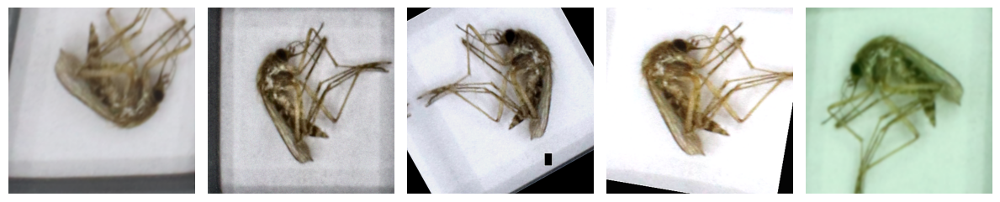

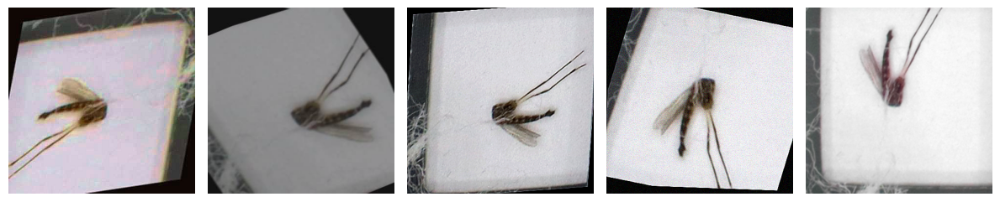

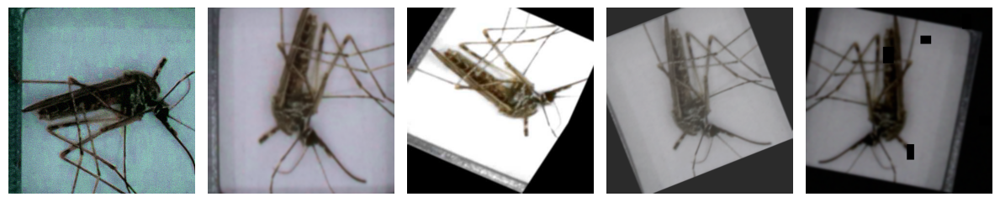

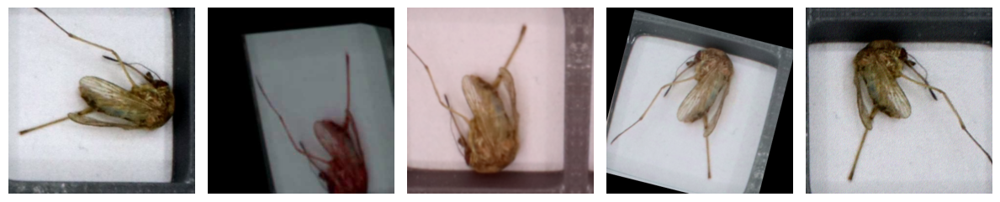

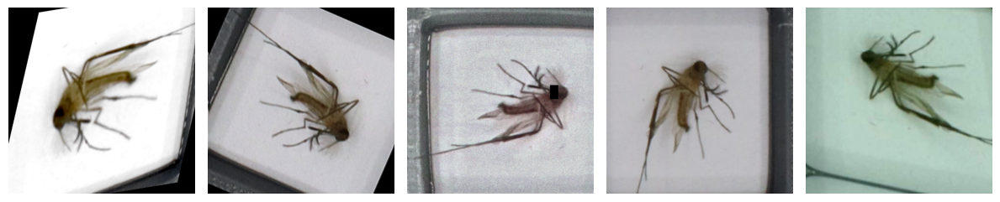

...

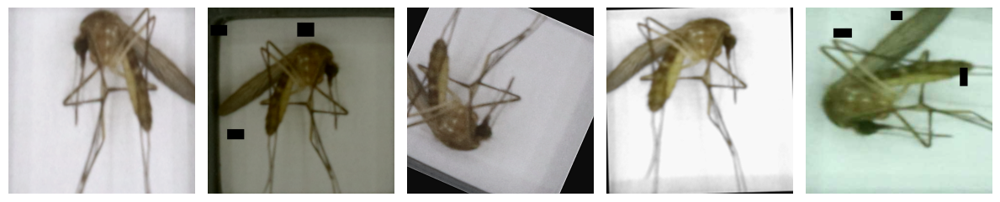

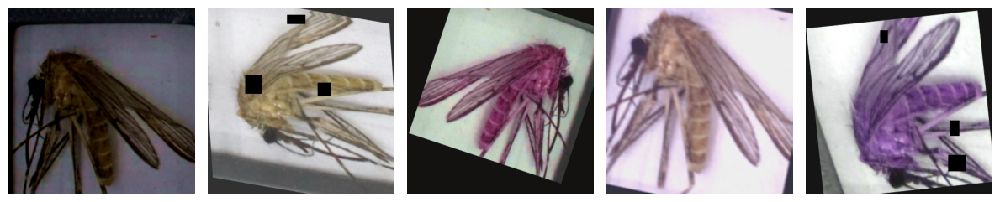

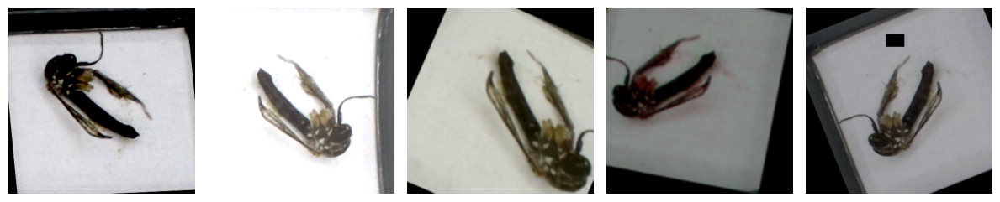

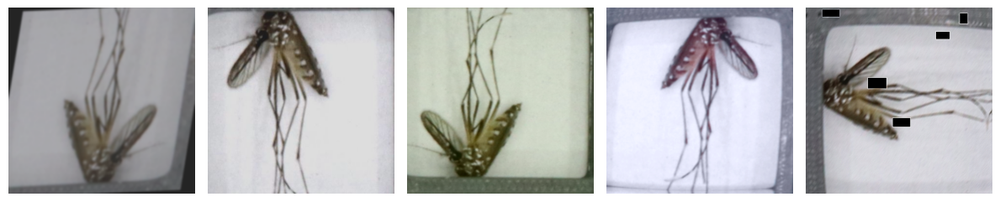

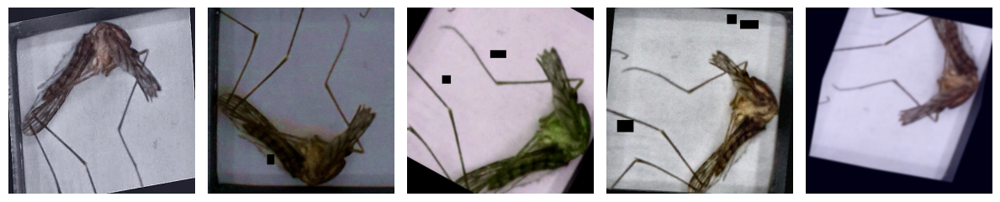

In [11]:

for i in range(300,1400,50):
  visualize_augmentations(dataset=train_dataset, idx=i, samples=5, cols=5,SAVE = "")



In [11]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=1e-3, mode="max"):
        self.patience = patience
        self.min_delta = min_delta
        self.wait = 0
        
        # se vogliamo massimizzare l'accuracy o minimizzare la loss
        self.best = -float("inf") if mode == "max" else float("inf")
        # viene creata una funzione anonima che prende cur, best in input e ti restituisce True o False 
        self.comp = (lambda cur, best: cur - best >  min_delta) if mode == "max" \
                   else (lambda cur, best: best - cur >  min_delta)

    def step(self, metric):
        if self.comp(metric, self.best):
            self.best = metric
            self.wait = 0
            return False, True   # (should_stop, improved)
        else:
            self.wait += 1
            return self.wait >= self.patience, False

###

### Model and architecture

###

In [12]:
# Architettura Huge - MODIFICHE TRAINING - ESATTAMENTE COME DICE NELL'ARTICOLO

"""

Discriminative LR
Head riceve un LR pieno, l’ultimo stage 5 × più basso, i primissimi layer 25 × più basso → eviti l’over-update dei 500 M di pesi appena sbloccati.
L’effetto pratico è che il grad-norm dei primi blocchi scende di ~10-20× rispetto a prima, quindi niente “catastrophic forgetting”.

Optimizer e scheduler
Ogni fase ottiene momentum/Adam state pulito; il warm-up parte da LR ≈ 1 e-7 e cresce in ∼ 5 % dei passi totali, con transizione dolce al coseno senza “salto” tra fasi.

Gradient clipping + AMP
Se qualche batch produce gradiente anomalo (tipico quando si sblocca tutto) viene troncato a 1.0. In mixed-precision questo evita overflow e abbassamento drastico del GradScaler.

Scheduler per batch
Il vecchio codice face step su epoche → solo 25 step totali di coseno (troppo brusco) e warmup di 2 step (solo 2 epoche, non 2 × N-batch). Ora il warm-up copre centinaia di passi reali, rendendo l’adattamento molto più stabile.

Così il primo epoch di full-ft mostra una loss simile all’ultimo di last-stage invece di salvare drasticamente.
"""

from tqdm import tqdm
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.optim import AdamW
from torch.optim.lr_scheduler import LinearLR, CosineAnnealingLR, SequentialLR
import timm
from typing import List, Dict
import math
from collections import defaultdict
from torch.cuda.amp import autocast, GradScaler
import torch.nn.functional as F
from collections import Counter
from torch.utils.data import IterableDataset

class MosquitoMultiTask(nn.Module):
    def __init__(
        self,
        num_genus: int,
        num_species: int, # qui deve andare il numero di specie che vede il modello, nel senso che le specie rimangono n_classes (in params), ma il modello ne conosce solo un certo numero, le restanti sono unknown 
        species_map: dict,
        device : torch.device,
        backbone_weights: str | None = None,
        alpha: float = 0.5, # iperparametro nelle a loss totale
    ):

        super().__init__()
        self.num_genus = num_genus
        self.num_species = num_species
        self.alpha = alpha
        self.species_map = species_map
        self.device = device

        # Inizializza backbone
        """      
        # QUESTO PER MODELLO BASE
        self.backbone = timm.create_model(
            'convnextv2_base', pretrained=False, num_classes=0, global_pool='avg'
        )
        hidden_dim = self.backbone.num_features
        if backbone_weights is not None and Path(backbone_weights).exists():
            sd = torch.load(backbone_weights, map_location=self.device)
            if "model_state_dict" in sd:
                sd = sd["model_state_dict"]
            head_prefixes = ("head.", "classifier.", "fc.", "last_linear.")
            filtered = {k: v for k, v in sd.items() if not k.startswith(head_prefixes)}
            self.backbone.load_state_dict(filtered, strict=False)
            print(f"[MosquitoMT] Backbone caricato da: {backbone_weights}")
        """
        
        # mi serve giusto per avere il caricato da timm, i pesi glieli carico io da locale
        # se metti 0: il modello non crea la testa di classificazione finale (classifier head viene rimossa).
        # il global pooling serve a comprimere ogni feature map spaziale (quindi ogni matrice H' x W' per ogni canale) in un solo numero per canale.
        # nel mio caso: calcola la media di tutti i valori della feature map per ogni canale.
            
        self.backbone = timm.create_model(
            'convnextv2_huge', pretrained=False, num_classes=0, global_pool='avg')

        hidden_dim = self.backbone.num_features          

        if backbone_weights is not None and Path(backbone_weights).exists():
            #carica lo state dictionary (sd) o model
            sd = torch.load(backbone_weights, map_location=self.device)
            
            # prova entrambe le chiavi
            if "model_state_dict" in sd:
                sd = sd["model_state_dict"]
            elif "model" in sd:
                sd = sd["model"]
                
            # leva la testa se presente
            head_prefixes = ("head.", "classifier.", "fc.", "last_linear.")
            filtered = {k: v for k, v in sd.items() if not k.startswith(head_prefixes)}
            # carico un nuovo state dic, strict=False significa che se trova pesi mancanti o extra li ignora, utile sempre per il problema della head
            self.backbone.load_state_dict(filtered, strict=False)
            print(f"[MosquitoMT] Backbone caricato da: {backbone_weights}")

        # Teste di classificazione - una per genus e una per species
        self.head_genus = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Linear(hidden_dim // 2, num_genus),
        )

        self.head_species_evidence = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(inplace=True),   
            nn.Dropout(0.1),
            nn.Linear(hidden_dim // 2, num_species + 1),
            nn.Softplus(),           
        )
        
        self.to(self.device)
        self.scaler = GradScaler()
        self.register_buffer("genus_weights", torch.ones(num_genus, device=self.device)) #  self.register_buffer è un metodo ereditato da nn.Module e si usa per registrare dei tensori come buffer del modulo e non come parametri
         
    # ------------------------------------------------------------------
    #  Param-groups con LR diversi per head, stage4 e primi stage
    # ------------------------------------------------------------------
    
    def _build_param_groups(self, phase_cfg: dict) -> list[dict]:
        """
        Ritorna i param-groups per l’ottimizzatore, con LR diversi
        per head, ultimo stage del backbone e layers precedenti.
        """
        head, stage4, earlier = [], [], []
    
        for n, p in self.named_parameters(): # itera sui nomi e sui valori dei parametri
            if not p.requires_grad:
                continue
    
            if n.startswith(("head_genus", "head_species_evidence")): # è come dire "se n è uguale a head_genus o head_species_evidence
                head.append(p)
            elif n.startswith("backbone.stages.3"):
                stage4.append(p)
            else:
                earlier.append(p)
    
        lr, wd, name = phase_cfg["lr"], phase_cfg["weight_decay"], phase_cfg["name"] # mi prende la config della phase in questione
    
        if name == "head-only":
            return [{"params": head, "lr": lr, "weight_decay": wd}]
    
        if name == "last-stage":
            return [
                {"params": head,   "lr": lr,       "weight_decay": wd},
                {"params": stage4, "lr": lr * 0.1, "weight_decay": 1e-6},
            ]
    
        # full-fine-tuning
        return [
            {"params": head,    "lr": lr,        "weight_decay": 1e-6},
            {"params": stage4,  "lr": lr * 0.2,  "weight_decay": 1e-6},
            {"params": earlier, "lr": lr * 0.04, "weight_decay": 0.0},
        ]
    
    
    # ---------- FREEZE / UNFREEZE ------------------------------------------------
    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False
        for p in self.head_genus.parameters():
            p.requires_grad = True
        for p in self.head_species_evidence.parameters():
            p.requires_grad = True
    
    
    def unfreeze_last_stage(self):
        for p in self.backbone.parameters():
            p.requires_grad = False
        for p in self.backbone.stages[-1].parameters():
            p.requires_grad = True
        for p in self.head_genus.parameters():
            p.requires_grad = True
        for p in self.head_species_evidence.parameters():
            p.requires_grad = True
    
    
    def unfreeze_all(self):
        for p in self.backbone.parameters():
            p.requires_grad = True
        for p in self.head_genus.parameters():
            p.requires_grad = True
        for p in self.head_species_evidence.parameters():
            p.requires_grad = True

    def configure_optimizers(self, phase_cfg: dict, steps_per_epoch: int):
            # steps_per_epoch sarebbe il numero di batch necessari per arrivare al numero di sample nel dataset
            # crea optimizer con i nuovi param_groups
        
            param_groups = self._build_param_groups(phase_cfg) # è un dizionario con tutte le info sui parametri , lr e wd - per quella specifica fase
    
            #i parametri betas=(0.9, 0.95) si riferisce ai coefficienti usati per il calcolo delle medie mobili dei gradienti e dei loro quadrati.
            # il primo tiene conto del 90% del valore della vecchia media e il 95% della vecchia varianza del grad
            self.optimizer = AdamW(param_groups, betas=(0.9, 0.95))
    
            # ── warm-up lineare e poi coseno CONTINUO ────────────────
            wu_epochs = phase_cfg["warmup_epochs"]
            total_ep  = phase_cfg["epochs"]
            base_lr   = phase_cfg["lr"]
    
            warm_steps  = wu_epochs * steps_per_epoch # numero di steps in termini di batch da fare in warm phase
            total_steps = total_ep * steps_per_epoch - warm_steps # numero rimanente di steps
    
            warm = LinearLR(self.optimizer, 1e-3, 1.0, total_iters=warm_steps) # learning rate cresce da 1e-3 fino a base_lr nei primi warm_steps step
            cos  = CosineAnnealingLR(self.optimizer, T_max=total_steps,
                                     eta_min=base_lr * 0.02) # dopo il warmup, il learning rate decresce gradualmente secondo una curva a coseno fino al 2% del base_lr
            self.scheduler = SequentialLR(self.optimizer, [warm, cos],
                                          milestones=[warm_steps]) # dice dopo quanti step cambiare scheduler

    
        # ========= 1. FORWARD ===================================================
    def forward(self, x: torch.Tensor) -> dict[str, torch.Tensor]:
        """
        Ritorna:
          logits_genus  : [B, G]
          evidence_species : [B, K+1]  
          alpha_species    : evidence+1
          S_species        : somma \alpha
          probs_species    : E[p_k]   (\alpha/S)
        """
        feats = self.backbone(x)
    
        logits_genus = self.head_genus(feats)            # [B, G]
    
        evidence = self.head_species_evidence(feats)   # → [B, K+1]
        alpha    = evidence + 1.0                      # → [B, K+1]
        S        = alpha.sum(dim=1, keepdim=True)      # → [B, 1]
        probs    = alpha / S                           # → [B, K+1]
    
        return {
            "logits_genus": logits_genus,
            "evidence_species": evidence,
            "alpha_species": alpha,
            "S_species": S,
            "probs_species": probs,
        }


    @torch.no_grad()
    def _compute_genus_weights(self, loader: DataLoader,
                               beta: float = 0.999) -> torch.Tensor:
        """
        Restituisce un tensor [G] con pesi inversamente proporzionali alla
        frequenza del genere in train set

        beta<1 applica la smoothed-inverse freq:
            w_g = (1 - beta) / (1 - beta**n_g)
        impedisce che classi con pochissimi esempi esplodano di peso.
        
        """
        # 1) Conta occorrenze per genus
        counts = Counter()
        for _, labels_s_raw in loader:
            g = labels_to_genus_ids(labels_s_raw, self.species_map)
            counts.update(g.cpu().tolist())

        # 2) Converte in tensor
        freq = torch.zeros(self.num_genus, dtype=torch.float32)
        for g, n in counts.items():
            freq[g] = n

        # 3) Formula di re-weighting
        weights = (1.0 - beta) / (1.0 - beta**freq)
        weights[freq == 0] = 0.0            # paranoia: classi mai viste
        weights = weights / weights.mean()  # normalizza: Σw ≈ G
        return weights.to(self.device)
            
    def infer(self,
              imgs: torch.Tensor,
              return_intermediate: bool = False):

        self.eval()
        with autocast(enabled=False):              # mantieni fp32 per stabilità
            out = self.forward(imgs)
    
        # ---------- GENUS ----------------------------------------------------
        p_genus = torch.softmax(out["logits_genus"], dim=1)  # [B, G]
        genus_conf, genus_pred = p_genus.max(dim=1)          # [B]
    
        # ---------- SPECIES (K + 1) -----------------------------------------
        probs = out["probs_species"]                         # [B, K+1]
        species_conf, species_pred = probs.max(dim=1)       # argmax su tutte
        species_pred = species_pred.clone()                 # clone() evita problemi di aliasing dei dati e rende chiaro che si sta lavorando su una nuova copia dei dati
    
        p_unknown = probs[:, self.num_species]              # colonna unknown
        p_known   = probs[:, :self.num_species]             # solo specie note
    
        # ---------- COERENZA GENUS–SPECIES ----------------------------------
        mapped_genus = labels_to_genus_ids(species_pred, self.species_map)
        mismatch = mapped_genus != genus_pred               # bool mask [B]
    
        # se mismatch  forza specie a unknown
        species_pred[mismatch]  = self.num_species # ricordo che num_species è l'indice assocciato alla classe unknown
        species_conf[mismatch]  = p_unknown[mismatch]

    
        # ---------- OUTPUT ---------------------------------------------------
        out_dict = dict(
            genus_pred    = genus_pred,
            genus_conf    = genus_conf,
            species_pred  = species_pred,
            species_conf  = species_conf,
            p_known       = p_known,
            p_unknown     = p_unknown
        )
    
        if return_intermediate:
            out_dict.update(dict(
                evidence_species = out["evidence_species"],
                alpha_species    = out["alpha_species"],
                S_species        = out["S_species"],
                probs_species    = probs
            ))
        return out_dict



    """
        
    def _dirichlet_kl(self, alpha: torch.Tensor) -> torch.Tensor:
        prior      = torch.ones_like(alpha)
        sum_alpha  = alpha.sum(dim=1, keepdim=True)
        sum_prior  = prior.sum(dim=1, keepdim=True)
    
        term1 = torch.lgamma(sum_alpha) - torch.lgamma(sum_prior)
        term2 = (torch.lgamma(prior) - torch.lgamma(alpha)).sum(dim=1, keepdim=True)
        term3 = ((alpha - prior) *
                 (torch.digamma(alpha) - torch.digamma(sum_alpha))).sum(dim=1, keepdim=True)
        return (term1 + term2 + term3).mean()            # scalar
    """
    

    def compute_loss(self,
                     out: dict[str, torch.Tensor],
                     labels_s_raw: torch.Tensor,
                     labels_s_clamped: torch.Tensor, # quelli che hanno indice fino a num_species , dopodichè vengono mappati tutti in una specie unknown
                     kl_weight: float = 0.5):
    
        # ---------- 1. Genus CE --------------------------------------------
        genus_labels = labels_to_genus_ids(labels_s_raw, self.species_map).long()

        w = self.genus_weights.to(
                device=out["logits_genus"].device, # mi mette w sullo stesso device di out["logits_genus"]
                dtype=out["logits_genus"].dtype    # mi crea i pesi w con la stessa precisione di out["logits_genus"] 
            )
        loss_genus = F.cross_entropy(out["logits_genus"], genus_labels, weight=w)  # i pesi vengono calcolati   

        # ---------- 2. Species MSE (K + 1) ---------------------------------
        onehot = F.one_hot(labels_s_clamped, self.num_species + 1).to(device=out["probs_species"].device, dtype=out["probs_species"].dtype)
        #loss_species = F.mse_loss(out["probs_species"], onehot) 
        
        loss_sq = F.mse_loss(out["probs_species"], onehot)

        alpha = out["alpha_species"]   # parametri della dirichlet
        S     = out["S_species"]       # forza delle evidenze           
        var   = (alpha * (S - alpha)) / (S * S * (S + 1.0)) #calcolo la varianza così come descritta nell'articolo dell'm-EDL
        
        loss_var = var.sum(dim=1).mean()

        loss_species = loss_sq + loss_var
    
        # ---------- 3. KL Dirichlet ----------------------------------
        # loss_kl = self._dirichlet_kl(out["alpha_species"]) * kl_weight    # non serve mettere regolarizzatori in m-EDL come in EDL (tant'è che non è citato nell'articolo m-EDL), in caso di incertezza il modello automaticmaente metterà delle belief mass nella classe unknown
    
        # ---------- 4. Penalità genus–species ------------------------------
        with torch.no_grad():
            pred_g        = out["logits_genus"].argmax(1)      # genus predetto
            pred_s        = out["probs_species"].argmax(1)     # specie predetta ovviamente sulle probabilità
            mapped_pred_s = labels_to_genus_ids(pred_s, self.species_map)
            mismatch      = (mapped_pred_s != pred_g).float()
        dep_penalty = (torch.exp(mismatch) - 1.0).mean()
    
        # ---------- 5. Loss totale -----------------------------------------
        level_loss = loss_genus + loss_species  # + loss_kl se lo riattivi
        total      = self.alpha * level_loss + (1.0 - self.alpha) * dep_penalty # alpha iperparametro
    
        return (total,
                loss_genus.item(),
                loss_species.item(),
                dep_penalty.item())

    
    def run_epoch(self, loader: DataLoader, training: bool):
        self.train() if training else self.eval()
    
        total_loss = 0.0
        correct_g = correct_s = total = 0
    
        desc   = "Train" if training else "Val  "
        prefix = "train" if training else "val"
        loop   = tqdm(loader, desc=desc, leave=False) # barra di avanzamento sui batch del loader
    
        unknown_idx = self.num_species            # indice classe “unknown”
    
        for imgs, labels_s_raw in loop:           
            imgs  = imgs.to(self.device)
            labels_s_raw = labels_s_raw.to(self.device).long() # qui i label vanno da 0 a 14
            labels_s_clamped = torch.where(
                labels_s_raw >= unknown_idx,                           # Condizione booleana
                torch.full_like(labels_s_raw, unknown_idx),            # Se True: assegna unknown_idx
                labels_s_raw                                           # Se False: lascia il valore originale
            ).long()
    
            with autocast(enabled=training):
                out  = self.forward(imgs)
                loss, *_ = self.compute_loss(
                    out,
                    labels_s_raw,      # genus / penalty
                    labels_s_clamped   # specie / unknown
                )
    
            if training:
                self.optimizer.zero_grad(set_to_none=True) # è più efficiente metterli come None anzichè 0
                self.scaler.scale(loss).backward() # scalo i gradienti per AMP e poi propago con backward
                self.scaler.unscale_(self.optimizer) # riporta i gradienti alla scala originale (divide per lo stesso fattore di scaling usato prima)
                torch.nn.utils.clip_grad_norm_(self.parameters(), 1.0) # Limita il valore massimo (norma L2) dei gradienti di tutti i parametri a 1.0. Serve per evitare “exploding gradients” (che potrebbero causare update instabili e divergenza).
                self.scaler.step(self.optimizer) # aggiorna i pesi . in AMP, questo step viene eseguito solo se il GradScaler non ha rilevato overflow
                self.scaler.update() # il GradScaler aggiorna il suo fattore di scaling, adattandosi dinamicamente (abbassa se rileva overflow, alza se va tutto bene).
                self.scheduler.step() # si chiama il learning rate associato al batch successivo
    
            bs = imgs.size(0)
            total      += bs
            total_loss += loss.item() * bs
    
            pred_g = out["logits_genus"].argmax(1)
            pred_s = out["probs_species"].argmax(1)
    
            true_g = labels_to_genus_ids(labels_s_raw, self.species_map)  # ← genus da RAW
            correct_g += (pred_g == true_g).sum().item()
    
            correct_s += (pred_s == labels_s_clamped).sum().item()        # specie vs CLAMPED
    
            loop.set_postfix({ # mi scrive queste cose sulla barra di avanzamento
                f"{prefix}_loss"        : f"{total_loss/total:.4f}",
                f"{prefix}_acc_genus"   : f"{correct_g/total:.3f}",
                f"{prefix}_acc_species" : f"{correct_s/total:.3f}"
            })
    
        return total_loss / total, correct_g / total, correct_s / total


    def fit(self, train_loader: DataLoader, val_loader: DataLoader, phases: list,
            patience: int = 10, min_delta: float = 0.001) -> dict:
        
        new_w = self._compute_genus_weights(train_loader)   # calcolo dei pesi dalla frequenza del dataloader in questione
        self.genus_weights.data.copy_(new_w)                # salva nel buffer
        
        history = {
            'best_species_acc': 0.0,
            'train_losses': [], 'val_losses': [],
            'train_acc_g': [],  'val_acc_g': [],
            'train_acc_s': [],  'val_acc_s': []
        }
        best_state = None
    
        for phase in phases:


            epochs = phase['epochs']
            if phase.get('unfreeze_last_stage', False):
                self.unfreeze_last_stage()
            elif phase.get('name') == 'full-ft':
                self.unfreeze_all()
            else:
                self.freeze_backbone()
                
            steps_per_epoch = len(train_loader)
            self.configure_optimizers(phase, steps_per_epoch) # non ritorna niente ma setta l'optimizer e scheduler
            es = EarlyStopping(patience, min_delta, mode="max")
    
            tqdm.write(f"\n==== Phase: {phase['name']} (epochs {epochs}) ====")
    
            for epoch in range(1, epochs + 1):
                tr_loss, tr_ag, tr_as = self.run_epoch(train_loader, training=True)
                torch.cuda.empty_cache()
                vl_loss, vl_ag, vl_as = self.run_epoch(val_loader, training=False)
    
                history['train_losses'].append(tr_loss)
                history['val_losses'].append(vl_loss)
                history['train_acc_g'].append(tr_ag)
                history['val_acc_g'].append(vl_ag)
                history['train_acc_s'].append(tr_as)
                history['val_acc_s'].append(vl_as)
    
                tqdm.write(
                    f"Ep {epoch:2d}/{epochs} | "
                    f"train_loss {tr_loss:.4f} | val_loss {vl_loss:.4f} | "
                    f"train_genus_acc {tr_ag:.3f} | val_genus_acc {vl_ag:.3f} | "
                    f"train_species_acc {tr_as:.3f} | val_species_acc {vl_as:.3f}"
                )
    
                stop, improved = es.step(vl_as)
                if improved:
                    history['best_species_acc'] = vl_as
                    best_state = {k: v.cpu() for k, v in self.state_dict().items()}
                    tqdm.write(f"↳ New best val_species_acc {vl_as:.3f} – weights saved.")
                if stop:
                    tqdm.write(f"Early-stopping: no improvement for {patience} epochs")
                    break
    
        if best_state is not None:
            self.load_state_dict(best_state)
        return history
    


###

### Training and saving histories, model

###

In [ ]:
# CHIAMATA E TRAIN DI NUOVO MODELLO MISTO

from pathlib import Path
import os
import torch
import numpy as np
from torchsummary import summary

# ─────────────────────────────────────────────────────────────────────────────
# 0) Costruisci species_map, genus2num, labels_to_genus_ids deve esistere già
#    species_map: dict {indice_specie:int → nome_genere:str}
# ─────────────────────────────────────────────────────────────────────────────
species_map = {idx: name for name, idx in params["strig2num"].items()}

# ─────────────────────────────────────────────────────────────────────────────
# 1) Percorso ai pesi del backbone (senza head)

#weight_path = absolute_path / "convnextv2_base_backbone.pth"
weight_path = absolute_path / "convnextv2_huge.fcmae_ft_in22k_in1k_512_backbone.pth"

# ─────────────────────────────────────────────────────────────────────────────
# 2) Istanzia il modello multitask
# ─────────────────────────────────────────────────────────────────────────────
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MosquitoMultiTask(
    species_map=species_map,
    num_genus=4,
    num_species=8,
    device=device,
    backbone_weights=str(weight_path),
    alpha=0.5,
)

summary(model, input_size=(3, 224, 224))

#epochs - warmup_epochs per phase : 20 - 5, 15 - 3, 30 - 3

# ─────────────────────────────────────────────────────────────────────────────
# 3) Definisci fasi di training
# ─────────────────────────────────────────────────────────────────────────────

PHASES = [
    {"name": "head-only",  "epochs": 20, "lr": 3e-4,  "weight_decay": 3e-4, "warmup_epochs": 5},
    {"name": "last-stage", "epochs": 15, "lr": 1e-4,  "weight_decay": 5e-6, "warmup_epochs": 3, "unfreeze_last_stage": True},
    {"name": "full-ft",    "epochs": 30, "lr": 5e-5,  "weight_decay": 1e-6, "warmup_epochs": 3}
]

# ─────────────────────────────────────────────────────────────────────────────
# 4) Esegui training
# ─────────────────────────────────────────────────────────────────────────────
hist = model.fit(train_loader, val_loader, PHASES, patience=10, min_delta=0.001)

# ─────────────────────────────────────────────────────────────────────────────
# 5) Salvataggio pesi “all-in-one” e history (incl. open-set stats)
# ─────────────────────────────────────────────────────────────────────────────
save_dir = Path(os.path.expandvars("$WORK/Mattia_Liguoro_final_project/Model_trained"))
save_dir.mkdir(parents=True, exist_ok=True)

# salva i pesi
torch.save(
    {
        **{f"backbone.{k}": v for k, v in model.backbone.state_dict().items()},
        **{f"head_genus.{k}": v for k, v in model.head_genus.state_dict().items()},
        **{f"head_species_evidence.{k}": v
           for k, v in model.head_species_evidence.state_dict().items()},
    },
    save_dir / "best_multitask_model_convnextv2_huge_17_06_mEDL_noKL_v2.pth"
)
# salva tutte le metriche
np.savez_compressed(
    save_dir / "history_multitask_model_convnextv2_huge_17_06_mEDL_noKL_v2.npz",
    best_species_acc = hist["best_species_acc"],
    train_losses     = np.array(hist["train_losses"]),
    val_losses       = np.array(hist["val_losses"]),
    train_acc_g      = np.array(hist["train_acc_g"]),
    val_acc_g        = np.array(hist["val_acc_g"]),
    train_acc_s      = np.array(hist["train_acc_s"]),
    val_acc_s        = np.array(hist["val_acc_s"]),
)


print(f"Pesi e history (incl. train/val/open-set stats) salvati in: {save_dir.resolve()}")


###

### Loss and Accuracy during Training and Validation 

###

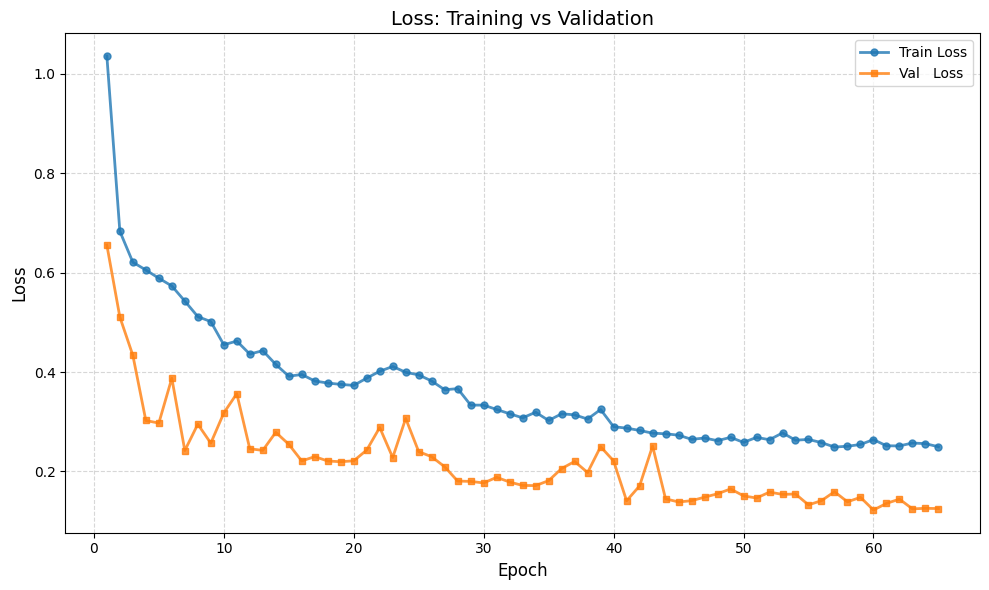

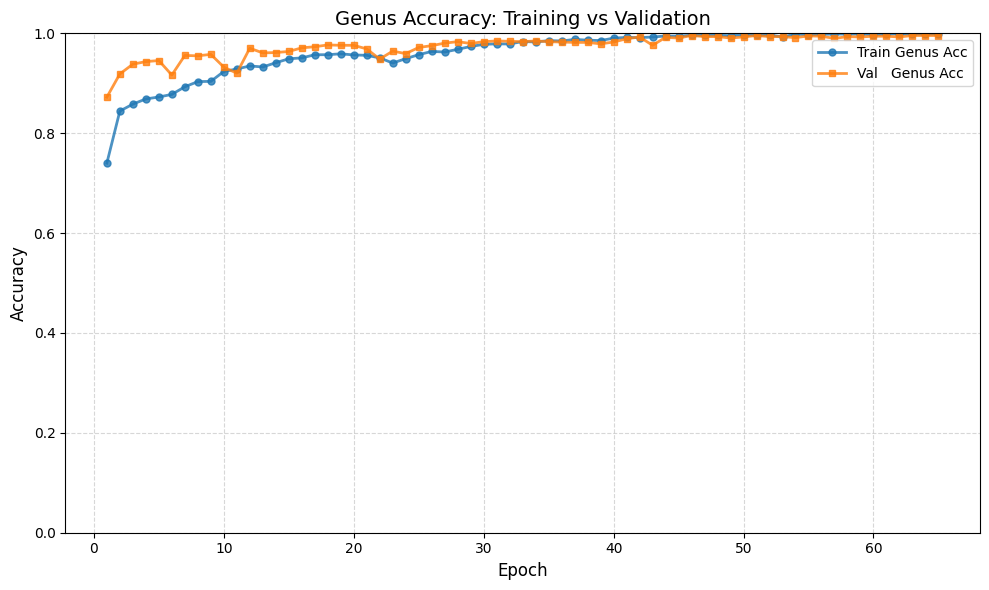

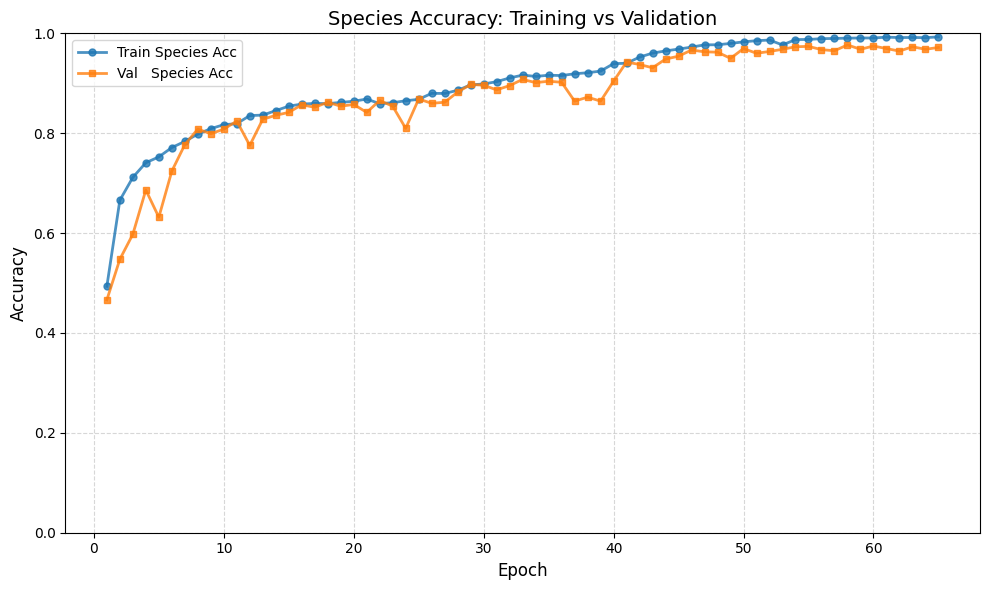

In [13]:
# ─────────────────────────────────────────────────────────────────────────────
# Percorso e caricamento
# ─────────────────────────────────────────────────────────────────────────────
save_dir     = Path(os.path.expandvars("$WORK/Mattia_Liguoro_final_project/Model_trained"))
history_path = save_dir / "history_multitask_model_convnextv2_huge_17_06_mEDL_noKL_v2.npz"

data = np.load(history_path, allow_pickle=True)

train_losses   = data["train_losses"]
val_losses     = data["val_losses"]
train_acc_g    = data["train_acc_g"]
val_acc_g      = data["val_acc_g"]
train_acc_s    = data["train_acc_s"]
val_acc_s      = data["val_acc_s"]
  

epochs = np.arange(1, len(train_losses) + 1)

# ─────────────────────────────────────────────────────────────────────────────
# 1) Loss: Training vs Validation
# ─────────────────────────────────────────────────────────────────────────────
plt.figure(figsize=(10,6))
plt.plot(epochs, train_losses,    label="Train Loss",     linewidth=2, marker="o", markersize=5, alpha=0.8)
plt.plot(epochs, val_losses,      label="Val   Loss",     linewidth=2, marker="s", markersize=5, alpha=0.8)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Loss",  fontsize=12)
plt.title("Loss: Training vs Validation", fontsize=14)
plt.legend(fontsize=10)
plt.grid(linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 2) Genus Accuracy: Training vs Validation
# ─────────────────────────────────────────────────────────────────────────────
plt.figure(figsize=(10,6))
plt.plot(epochs, train_acc_g, label="Train Genus Acc", linewidth=2, marker="o", markersize=5, alpha=0.8)
plt.plot(epochs, val_acc_g,   label="Val   Genus Acc", linewidth=2, marker="s", markersize=5, alpha=0.8)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Genus Accuracy: Training vs Validation", fontsize=14)
plt.ylim(0,1.0)
plt.legend(fontsize=10)
plt.grid(linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 3) Species Accuracy: Training vs Validation
# ─────────────────────────────────────────────────────────────────────────────
plt.figure(figsize=(10,6))
plt.plot(epochs, train_acc_s, label="Train Species Acc", linewidth=2, marker="o", markersize=5, alpha=0.8)
plt.plot(epochs, val_acc_s,   label="Val   Species Acc", linewidth=2, marker="s", markersize=5, alpha=0.8)
plt.xlabel("Epoch", fontsize=12)
plt.ylabel("Accuracy", fontsize=12)
plt.title("Species Accuracy: Training vs Validation", fontsize=14)
plt.ylim(0,1.0)
plt.legend(fontsize=10)
plt.grid(linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


###

### Upload Model and Inference

###

In [14]:
#per caricare il modello pre addestrato e fare la mappa: pronto per inferenza

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#device = "cpu"

save_dir     = Path(os.path.expandvars("$WORK/Mattia_Liguoro_final_project/Model_trained"))
history_path = save_dir / "history_multitask_model_convnextv2_huge_17_06_mEDL_noKL_v2.npz"

species_map = {idx: name for name, idx in params["strig2num"].items()}

model = MosquitoMultiTask(
    species_map=species_map,
    num_genus=4,
    num_species=8,
    device=device,
    backbone_weights=None,   # non serve: carichi i pesi dopo
    alpha=0.5,
).to(device)

# carica i pesi salvati dopo il training precedente
state = torch.load(
    save_dir / "best_multitask_model_convnextv2_huge_17_06_mEDL_noKL_v2.pth",
    map_location=device
)
model.load_state_dict(state, strict=False)
model.eval()      # modalità inferenza


MosquitoMultiTask(
  (backbone): ConvNeXt(
    (stem): Sequential(
      (0): Conv2d(3, 352, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((352,), eps=1e-06, elementwise_affine=True)
    )
    (stages): Sequential(
      (0): ConvNeXtStage(
        (downsample): Identity()
        (blocks): Sequential(
          (0): ConvNeXtBlock(
            (conv_dw): Conv2d(352, 352, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=352)
            (norm): LayerNorm((352,), eps=1e-06, elementwise_affine=True)
            (mlp): GlobalResponseNormMlp(
              (fc1): Linear(in_features=352, out_features=1408, bias=True)
              (act): GELU()
              (drop1): Dropout(p=0.0, inplace=False)
              (grn): GlobalResponseNorm()
              (fc2): Linear(in_features=1408, out_features=352, bias=True)
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (shortcut): Identity()
            (drop_path): Identity()
          )
          (1

In [15]:
import torch
from tqdm import tqdm

@torch.no_grad()
def test_model(model, test_loader):
    """
    Valuta il modello e restituisce:
        – metriche di base
        – conteggi FP / FN e relative %
        – totale unknown presenti nel test set
    """
    model.eval()
    device      = model.device
    unknown_idx = model.num_species

    # accumulatori
    total_genus = correct_genus = 0
    total_known = correct_known = 0
    total_unknown = hit_unknown = 0       # TP_unknown
    pred_unknown = 0

    for imgs, labels_s in tqdm(test_loader, desc="Test", leave=False):
        imgs      = imgs.to(device)
        lbl_s_raw = labels_s.to(device).long()

        # clamping per la testa specie (K + 1 classi)
        lbl_s_clamped = torch.where(lbl_s_raw >= unknown_idx,
                                    torch.full_like(lbl_s_raw, unknown_idx),
                                    lbl_s_raw)

        # forward
        out          = model.infer(imgs)
        species_pred = out["species_pred"]
        genus_pred   = out["genus_pred"]

        # genus
        genus_true   = labels_to_genus_ids(lbl_s_raw, model.species_map)
        total_genus  += imgs.size(0)
        correct_genus += (genus_pred == genus_true).sum().item()

        # specie note
        is_known = lbl_s_raw < unknown_idx
        if is_known.any(): # se c'è almeno un is_known
            total_known   += is_known.sum().item() # somma sugli is_known nel batch
            correct_known += (species_pred[is_known] == lbl_s_raw[is_known]).sum().item()

        # unknown
        is_unk = lbl_s_raw >= unknown_idx      # >= per tutti gli id fuori range
        if is_unk.any(): # se in is_unk c'è almeno un valore True (quindi unknown) nel batch me lo somma
            total_unknown += is_unk.sum().item()
            hit_unknown   += (species_pred[is_unk] == unknown_idx).sum().item() # in particolare se la predizione di unknown è corretta , somma

        pred_unknown += (species_pred == unknown_idx).sum().item() # conta tutte le predizioni unknown

    # metriche base
    acc_genus  = correct_genus / total_genus  if total_genus  else 0.0
    acc_known  = correct_known / total_known  if total_known  else 0.0
    recall_unk = hit_unknown  / total_unknown if total_unknown else 0.0
    prec_unk   = hit_unknown  / pred_unknown  if pred_unknown  else 0.0

    # error analysis
    FN_unknown = total_unknown - hit_unknown
    FP_unknown = pred_unknown  - hit_unknown

    total_samples = total_genus
    pred_known    = total_samples - pred_unknown

    # percentuali
    fn_unk_pct = 100 * FN_unknown / total_unknown  if total_unknown else 0.0
    fp_unk_pct = 100 * FP_unknown / pred_unknown   if pred_unknown  else 0.0


    # stampa
    print(f"\n=== Test metrics ===")
    print(f"acc_genus        : {acc_genus:.3f}")
    print(f"acc_species_known: {acc_known:.3f}")
    print(f"recall_unknown   : {recall_unk:.3f}")
    print(f"precision_unknown: {prec_unk:.3f}")
    print(f"total_unknown    : {total_unknown}")

    print("\n--- Error analysis ---")
    print(f"FP_unknown = {FP_unknown:4d} ({fp_unk_pct:.1f}% delle pred. unknown)")
    print(f"FN_unknown = {FN_unknown:4d} ({fn_unk_pct:.1f}% dei reali unknown)")


    return dict(
        acc_genus=acc_genus,
        acc_species_known=acc_known,
        recall_unknown=recall_unk,
        precision_unknown=prec_unk,
        total_unknown=total_unknown,
        FP_unknown=FP_unknown,
        FN_unknown=FN_unknown,
        FP_unknown_pct=fp_unk_pct,
        FN_unknown_pct=fn_unk_pct,

    )


In [16]:
test_metrics = test_model(model, test_loader)


=== Test metrics ===
acc_genus        : 0.978
acc_species_known: 0.906
recall_unknown   : 0.875
precision_unknown: 0.848
total_unknown    : 464

--- Error analysis ---
FP_unknown =   73 (15.2% delle pred. unknown)
FN_unknown =   58 (12.5% dei reali unknown)


In [17]:
def extract_genus(species_name: str) -> str:
    """
    Prende un nome specie tipo
        'Aedes_aegypti'   oppure  'Anopheles gambiae'
    e restituisce 'Aedes' o 'Anopheles'.
    """
    return species_name.replace('_', ' ').split()[0]

def extract_epithet(full_name: str) -> str:
    """
    'Aedes_aegypti'  -> 'aegypti'
    'Anopheles gambiae' -> 'gambiae'
    """
    parts = full_name.replace('_', ' ').split()
    return parts[-1] if len(parts) > 1 else full_name

def build_genus_and_epithet_maps(species_map: dict[int, str]):
    """
    species_map  {id_specie -> nome_completo}
    Ritorna:
      genus_map            {id_genus    -> nome_genus}
      species_to_genus_id  {id_specie   -> id_genus}
      epithet_map          {id_specie   -> epiteto}
    """
    genus2id = {}
    sp2gen   = {}
    epithet  = {}

    for sp_id, full in species_map.items():
        gen  = full.replace('_', ' ').split()[0]         # prende il genus
        if gen not in genus2id:
            genus2id[gen] = len(genus2id)
        g_id          = genus2id[gen]
        sp2gen[sp_id] = g_id
        epithet[sp_id]= extract_epithet(full)

    genus_map = {gid: g for g, gid in genus2id.items()}
    return genus_map, sp2gen, epithet

In [18]:
def compute_confusion_matrices(model,
                               dataloader,
                               species_map,
                               genus_map,
                               species_to_genus_id,
                               device):
    """
    Calcola confusion-matrix specie/genus + statistiche unknown.

    extra = {
        'n_unk_from_species'  : # unknown generati dalla testa species
        'n_unk_from_mismatch' : # unknown generati dal forcing genus–species
    }
    """
    model.eval()
    gt_spec, pred_spec = [], [] # gt sta per ground truth
    gt_genus, pred_genus = [], []

    unk_idx = model.num_species          # indice “unknown species”
    unk_from_species  = 0
    unk_from_mismatch = 0

    with torch.no_grad():
        for imgs, lbl_s in dataloader:
            imgs      = imgs.to(device)
            lbl_s_raw = lbl_s.to(device).long()          # label reali (no clamp)

            # ---------- inferenza ---------------------------------
            out = model.forward(imgs)                    # logits
            p_genus = torch.softmax(out["logits_genus"], dim=1)
            genus_conf, genus_pred = p_genus.max(dim=1)

            probs = out["probs_species"]
            species_conf, species_pred_raw = probs.max(dim=1)  # PRIMA forcing

            # ---------- coerenza genus–species ---------------------------
            mapped_genus = labels_to_genus_ids(species_pred_raw, species_map)
            mismatch = mapped_genus != genus_pred            # bool mask

            # conteggi unknown DA SPECIES
            unk_from_species  += (species_pred_raw == unk_idx).sum().item()

            # conteggi unknown DA MISMATCH (solo se non già unknown)
            mismatch_only = mismatch & (species_pred_raw != unk_idx)
            unk_from_mismatch += mismatch_only.sum().item()

            # forcing finale
            species_pred = species_pred_raw.clone()
            species_pred[mismatch] = unk_idx

            # ---------- accumula per confusion-matrix --------------------
            lbl_s_clamped = torch.where(lbl_s_raw >= unk_idx,
                                        torch.full_like(lbl_s_raw, unk_idx),
                                        lbl_s_raw)

            gt_spec.append(lbl_s_clamped.cpu())
            pred_spec.append(species_pred.cpu())

            g_true = torch.tensor(
                [species_to_genus_id.get(int(s), -1) for s in lbl_s_raw.cpu()],
                dtype=torch.long)
            gt_genus.append(g_true)
            pred_genus.append(genus_pred.cpu())

    # ---------------- stack + numpy -------------------------------------
    gt_spec   = torch.cat(gt_spec).numpy()
    pred_spec = torch.cat(pred_spec).numpy()
    gt_genus  = torch.cat(gt_genus).numpy()
    pred_genus= torch.cat(pred_genus).numpy()

    cm_species = confusion_matrix(gt_spec,
                                  pred_spec,
                                  labels=np.arange(unk_idx + 1))

    valid = gt_genus != -1
    cm_genus = confusion_matrix(gt_genus[valid],
                                pred_genus[valid],
                                labels=np.arange(len(genus_map)))

    counts_spec = {i: (cm_species[i, i], cm_species[i].sum())
                   for i in range(unk_idx + 1)}
    counts_gen  = {i: (cm_genus[i, i], cm_genus[i].sum())
                   for i in range(len(genus_map))}

    extra = dict(
        n_unk_from_species  = unk_from_species,
        n_unk_from_mismatch = unk_from_mismatch
    )

    return cm_species, cm_genus, counts_spec, counts_gen, extra

    
def plot_cm_with_values(
    cm, class_names, title, figsize=(18, 14),
    label_fontsize=28, number_fontsize=22,
    axislabel_fontsize=30, title_fontsize=35,
    colorbar_fontsize=24
):
    cm_percent = cm / cm.sum(axis=1, keepdims=True) * 100
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(cm_percent, cmap='Blues', vmin=0, vmax=100)
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label='%')
    cbar.ax.tick_params(labelsize=colorbar_fontsize)
    cbar.set_label('%', fontsize=colorbar_fontsize)

    ax.set_xticks(np.arange(len(class_names)))
    ax.set_yticks(np.arange(len(class_names)))
    ax.set_xticklabels(class_names, rotation=45, ha='right', fontsize=label_fontsize)
    ax.set_yticklabels(class_names, fontsize=label_fontsize)
    ax.set_xlabel('Predicted', fontsize=axislabel_fontsize)
    ax.set_ylabel('True', fontsize=axislabel_fontsize)
    ax.set_title(title, fontsize=title_fontsize)

    # Annotate each cell with corr/tot and %
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            corr = cm[i, j]
            tot = cm[i].sum()
            pct = 0.0 if tot == 0 else (corr / tot) * 100
            txt = f"{int(corr)}/{int(tot)}\n({pct:.1f}%)" if corr > 0 else ""
            ax.text(j, i, txt, ha="center", va="center",
                    fontsize=number_fontsize,
                    color='black' if pct < 50 else 'white')

    plt.tight_layout()
    plt.show()


def summary_df(counts_dict, name_map):
    data = []
    for idx, (correct, total) in counts_dict.items():
        pct = 0.0 if total == 0 else correct / total * 100
        data.append([name_map.get(idx, f"ID{idx}"), f"{pct:.1f}%", f"{int(correct)}/{int(total)}"])
    return pd.DataFrame(data, columns=["Class", "Accuracy", "Correct/Total"])


Unknown totali: 479
  • da specie (bassa confidenza): 459
  • da mismatch genus–species  : 20


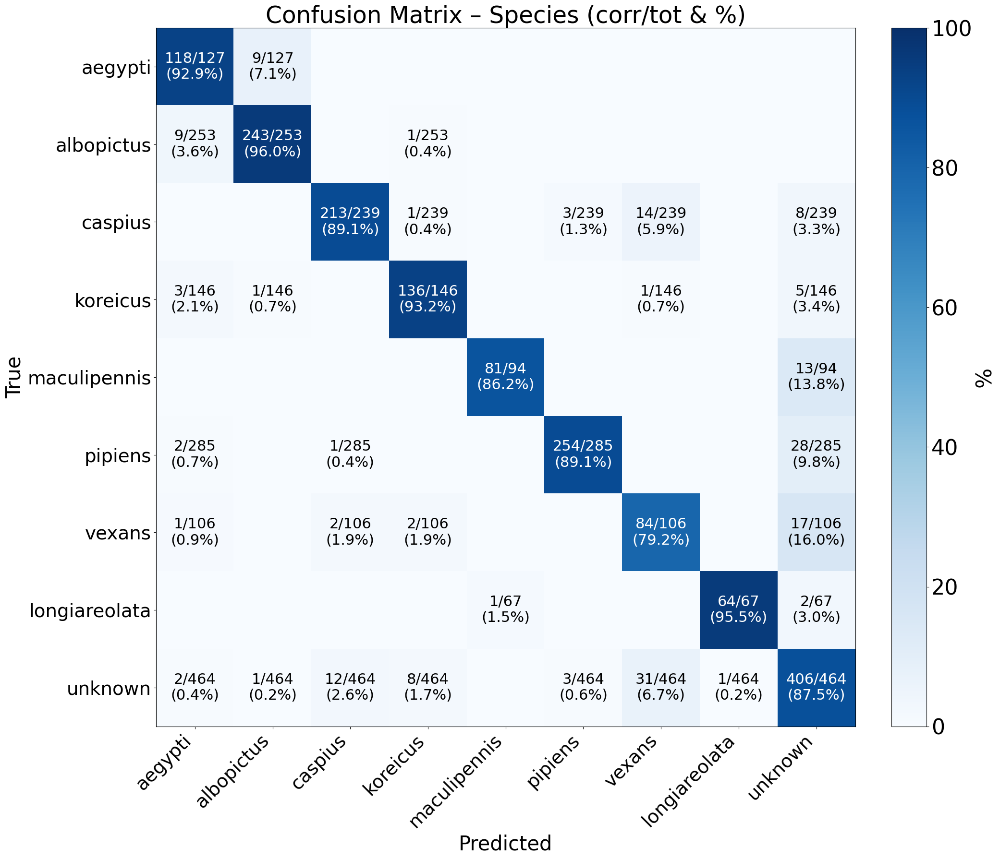

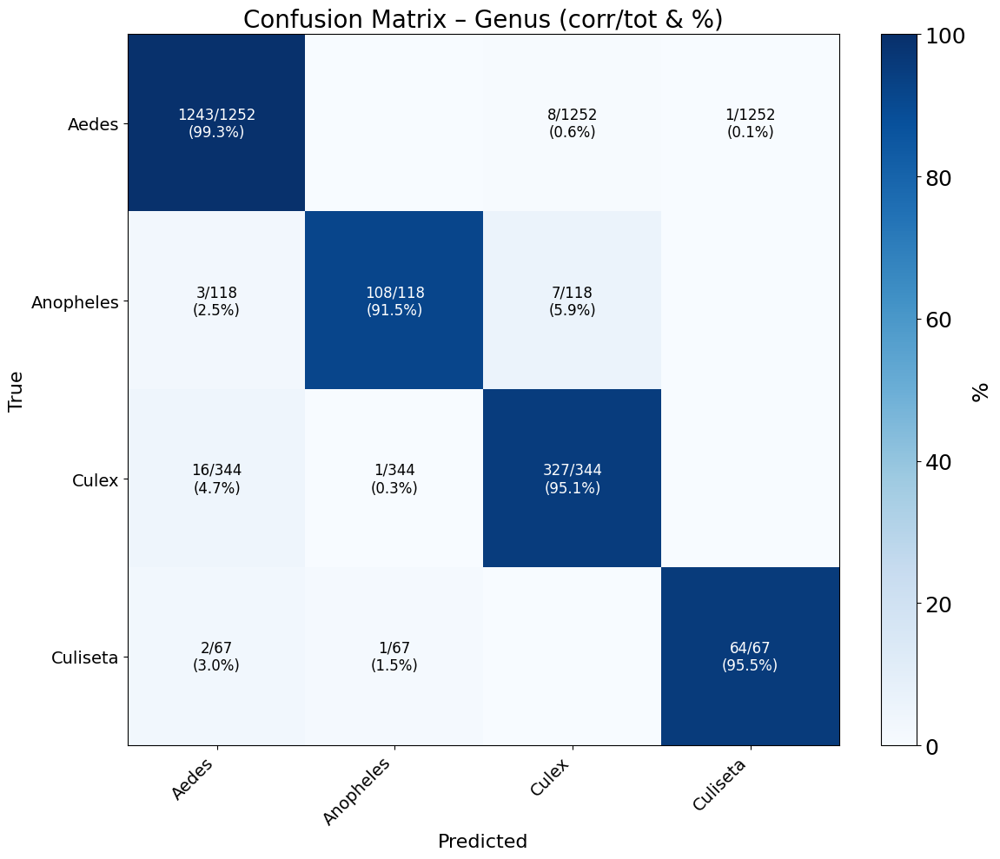

,Class,Accuracy,Correct/Total
0,aegypti,92.9%,118/127
1,albopictus,96.0%,243/253
2,caspius,89.1%,213/239
3,koreicus,93.2%,136/146
4,maculipennis,86.2%,81/94
5,pipiens,89.1%,254/285
6,vexans,79.2%,84/106
7,longiareolata,95.5%,64/67
8,unknown,87.5%,406/464


,Class,Accuracy,Correct/Total
0,Aedes,99.3%,1243/1252
1,Anopheles,91.5%,108/118
2,Culex,95.1%,327/344
3,Culiseta,95.5%,64/67


In [19]:
#chiamata per cm genus e species + tabelle percentuali e unknown accuracy 

genus_map, species_to_genus_id, epithet_map = build_genus_and_epithet_maps(species_map)

cm_s, cm_g, counts_s, counts_g, unk_stats = compute_confusion_matrices(
    model, test_loader,
    species_map, genus_map, species_to_genus_id, device)

print("Unknown totali:", unk_stats["n_unk_from_species"] + unk_stats["n_unk_from_mismatch"])
print("  • da specie (bassa confidenza):", unk_stats["n_unk_from_species"])
print("  • da mismatch genus–species  :", unk_stats["n_unk_from_mismatch"])

#label da dare alla cm
spec_names = [extract_epithet(species_map.get(i, f"ID{i}")) for i in range(model.num_species)] + ["unknown"] # estrae solo l'epiteto e poi aggiunge unknown
gen_names = [extract_genus(genus_map[i]) for i in range(len(genus_map))] # estrae solo il genere 

#cm specie
plot_cm_with_values(
    cm_s, spec_names,
    "Confusion Matrix – Species (corr/tot & %)",
    figsize=(22,18),
    colorbar_fontsize=32     
)

#cm genere
plot_cm_with_values(
    cm_g, gen_names,
    "Confusion Matrix – Genus (corr/tot & %)",
    figsize=(13,10),
    label_fontsize=14,
    number_fontsize=12,
    axislabel_fontsize=16,
    title_fontsize=20,
    colorbar_fontsize=18     
)

#tabelle accuracy genere e specie
spec_df = summary_df(counts_s, {**{i: extract_epithet(species_map[i]) for i in range(model.num_species)}, model.num_species: "unknown"})
gen_df = summary_df(counts_g, {i: extract_genus(genus_map[i]) for i in range(len(genus_map))})

display(spec_df)
display(gen_df)



### How the Expected Calibration Error (ECE) is calculated

The **Expected Calibration Error (ECE)** measures the discrepancy between a model's predicted **confidence** and its actual **accuracy**. 

We partition the dataset into $M$ bins based on the predicted confidence, and compute:

$ECE = \sum_{m=1}^M \frac{\|B_m\|}{n} \Big| \text{acc}(B_m) - \text{conf}(B_m) \Big|$

where:

- $\|B_m\|$ is the number of samples in the $m$-th bin,
- $n$ is the total number of samples,
- $\text{acc}(B_m)$ is the accuracy of the samples in the $m$-th bin,
- $\text{conf}(B_m)$ is the average predicted confidence of the samples in the $m$-th bin.

In [20]:
import torch
import numpy as np

def compute_ece_genus(model,
                      dataloader,
                      species_map,
                      n_bins: int = 15) -> float:
    """
    Expected Calibration Error (ECE) sulla testa *genus*.
    """
    model.eval()
    device = model.device

    bin_edges   = np.linspace(0.0, 1.0, n_bins + 1)   # 0–1 in n_bins blocchi
    bin_correct = np.zeros(n_bins, dtype=np.int64)    # TP per bin
    bin_total   = np.zeros(n_bins, dtype=np.int64)    # campioni per bin

    with torch.no_grad():
        for imgs, labels_s in dataloader:
            imgs      = imgs.to(device)
            labels_s  = labels_s.to(device).long()
            genus_true = labels_to_genus_ids(labels_s, species_map)

            out = model(imgs)                         
            probs = torch.softmax(out["logits_genus"], dim=1)

            conf, genus_pred = probs.max(dim=1)        # confidenza, predizione
            conf        = conf.cpu().numpy()
            genus_pred  = genus_pred.cpu().numpy()
            genus_true  = genus_true.cpu().numpy()

            for c, p, t in zip(conf, genus_pred, genus_true): #zip crea un iteratore che scorre in parallelo tre array della stessa lunghezza:
                bin_idx = np.digitize(c, bin_edges, right=True) - 1 #trovare a quale bin appartiene c, dato c, gli estremi dei bin 
                bin_total[bin_idx] += 1 # e ci somma più 1 a prescindere
                if p == t: # se la predizione è uguale al ground truth allora somma +1 corretto al bin in questione
                    bin_correct[bin_idx] += 1

    N   = bin_total.sum()
    ece = 0.0
    for k in range(n_bins):
        if bin_total[k] == 0:
            continue
        acc_k  = bin_correct[k] / bin_total[k]
        conf_k = (bin_edges[k] + bin_edges[k + 1]) / 2.0
        ece   += (bin_total[k] / N) * abs(acc_k - conf_k)

    return ece

In [21]:
ece_genus = compute_ece_genus(model, test_loader, species_map, n_bins=15)
print(f"ECE genus (15 bins): {ece_genus:.4f}")

ECE genus (15 bins): 0.0175


In [22]:
import torch, numpy as np, matplotlib.pyplot as plt

def plot_reliability_genus_safe(model, loader, species_map, n_bins=15):
    model.eval(); dev=model.device
    confs, rights = [], []

    with torch.no_grad():
        for x,spec in loader:
            x, spec = x.to(dev), spec.to(dev).long()
            g_true  = labels_to_genus_ids(spec, species_map)
            # rimpiazza eventuali -1 con id fittizio fuori range
            mask = g_true == -1
            if mask.any():
                g_true[mask] = g_true.max()+1
            out    = model.infer(x)
            confs.extend(out["genus_conf"].cpu().numpy())
            rights.extend((out["genus_pred"]==g_true).cpu().numpy())

    confs   = np.asarray(confs)
    rights  = np.asarray(rights)

    # binning equispaziato
    edges = np.linspace(0,1,n_bins+1)
    idx   = np.digitize(confs, edges, right=True)-1
    idx   = np.clip(idx,0,n_bins-1)

    total = np.bincount(idx, minlength=n_bins)
    correct = np.bincount(idx, weights=rights, minlength=n_bins)
    acc = np.divide(correct, total, out=np.zeros_like(correct, dtype=float), where=total!=0)
    centers = (edges[:-1]+edges[1:])/2

    # Accuracy globale dai bin
    weighted_acc = (acc*total).sum()/total.sum()
    # Accuracy diretta
    direct_acc = rights.mean()
    assert abs(weighted_acc-direct_acc)<1e-6, "mismatch fra bin e diretto!"

    # ---------- plot ----------
    plt.figure(figsize=(6,6))
    plt.plot([0,1],[0,1],'--',c='gray')
    plt.bar(centers, acc, width=edges[1]-edges[0],
            color='steelblue', edgecolor='black', alpha=.8)
    plt.xlim(0,1); plt.ylim(0,1)
    plt.xlabel("Confidence (genus)"); plt.ylabel("Accuracy")
    plt.title(f"Reliability genus – acc={direct_acc:.3f}")
    plt.grid(alpha=.3); plt.tight_layout(); plt.show()


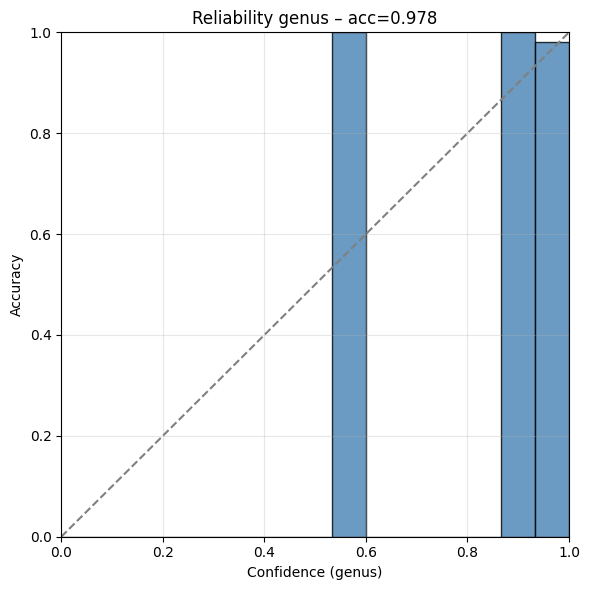

In [23]:
plot_reliability_genus_safe(model, test_loader, species_map, n_bins=15)

###

### Calibration with Temperature Scaling

We apply **temperature scaling** to calibrate the model’s output probabilities. This involves introducing a parameter $T > 0$ and adjusting the model’s logits $\mathbf{z}$:

$\mathbf{q} = \text{softmax}\!\Big(\frac{\mathbf{z}}{T}\Big)$

###

In [24]:
import torch.optim as optim
import torch.nn as nn
import torch

# Uso @property qui sotto nei metodi (temperature, device, num_species, species_map)
# perché così posso accedere a questi valori come se fossero attributi,
# cioè SENZA parentesi (es: model.temperature invece di model.temperature()).
#
# Questo rende il wrapper trasparente rispetto al modello di base:
# sia il modello PyTorch "vero" che il wrapper si usano con la stessa sintassi,
# senza dover ricordare quando servono le parentesi e quando no.


class GenusTemperatureWrapper(nn.Module):
    def __init__(self, base_model, init_T: float = 1.0):
        super().__init__()
        self.model = base_model            # MosquitoMultiTask già addestrato
        # parametro trainabile
        # si usa logT perchè la temperatura deve essere positiva ed in generale un parametro pytorch può anche essere <0
        self.log_temperature = nn.Parameter(
            torch.tensor(np.log(init_T), dtype=torch.float32)
        )

    @property
    def temperature(self):
        return self.log_temperature.exp() # qua lo esponenzio per avere di nuovo T

    @property
    def device(self):
        return self.model.device

    @property
    def num_species(self):
        return self.model.num_species

    @property
    def species_map(self):
        return self.model.species_map

    def forward(self, x):
        out = self.model.forward(x)                     
        T = self.temperature
        out["logits_genus"] = out["logits_genus"] / T   
        return out

    @torch.no_grad()
    def infer(self, imgs, return_intermediate=False):
        self.eval()
        with torch.cuda.amp.autocast(enabled=False):
            out = self.forward(imgs)

        p_genus = torch.softmax(out["logits_genus"], dim=1)
        genus_conf, genus_pred = p_genus.max(dim=1)

        probs = out["probs_species"]
        species_conf, species_pred = probs.max(dim=1)
        species_pred = species_pred.clone()

        p_unknown = probs[:, self.num_species]
        p_known   = probs[:, :self.num_species]

        mapped_genus = labels_to_genus_ids(species_pred, self.species_map)
        mismatch = mapped_genus != genus_pred
        species_pred[mismatch] = self.num_species
        species_conf[mismatch] = p_unknown[mismatch]

        out_dict = dict(
            genus_pred   = genus_pred,
            genus_conf   = genus_conf,
            species_pred = species_pred,
            species_conf = species_conf,
            p_known      = p_known,
            p_unknown    = p_unknown
        )

        if return_intermediate:
            out_dict.update(dict(
                evidence_species = out["evidence_species"],
                alpha_species    = out["alpha_species"],
                S_species        = out["S_species"],
                probs_species    = probs
            ))
        return out_dict
    # il metodo speciale __repr__ in Python serve a definire la "stringa rappresentativa" di un oggetto
    def __repr__(self):
        return f"{self.__class__.__name__}(T={self.temperature.item():.3f})"

# dato il modello, il validation set e la mappa sulle specie -> mi restituisce il wrapper con la temperatura giusta
def calibrate_genus_temperature(model,
                                val_loader,
                                species_map,
                                max_iter: int = 50,
                                lr: float = 0.01) -> GenusTemperatureWrapper:
    device = model.device
    wrapper = GenusTemperatureWrapper(model).to(device)
    wrapper.model.eval() # metto ovviamente il modello in eval
    wrapper.train()    # e il wrapper in train  

    # l'idea è la seguente:
    # raccoglie tutti i logit del genus e le label “vere” dal validation set.
    # costruisce una loss di cross-entropy tra i logit (scalati) e le label vere.
    # usa l’ottimizzatore LBFGS per trovare il valore di logT che minimizza la loss (una cross entropy)
⁡
    logits_list, labels_list = [], []
    with torch.no_grad():
        for imgs, lbl_species in tqdm(val_loader, desc="Collect logits", leave=False):
            imgs = imgs.to(device)
            logits = model(imgs)["logits_genus"]
            logits_list.append(logits)
            g_true = labels_to_genus_ids(lbl_species.to(device).long(),
                                         species_map)
            labels_list.append(g_true)

    logits_val = torch.cat(logits_list)
    labels_val = torch.cat(labels_list).long()

    criterion = nn.CrossEntropyLoss()

    optimizer = optim.LBFGS([wrapper.log_temperature], lr=lr, max_iter=max_iter) # internamente fa una serie di interazioni ma ha bisogno di una funzione closure nel quale si azzerano i gradienti, si def la loss e si calcolano i gradienti

    def _closure():
        optimizer.zero_grad()
        T = wrapper.temperature
        loss = criterion(logits_val / T, labels_val)
        loss.backward()
        return loss

    optimizer.step(_closure) # si ottimizza rispetto alla chiusura che fa quel che ho detto sopra (fa una serie di step sopra seguendo quella procedura)

    print(f"✓ Temperatura ottimizzata:  T = {wrapper.temperature.item():.3f}")
    wrapper.eval()
    return wrapper


✓ Temperatura ottimizzata:  T = 1.589


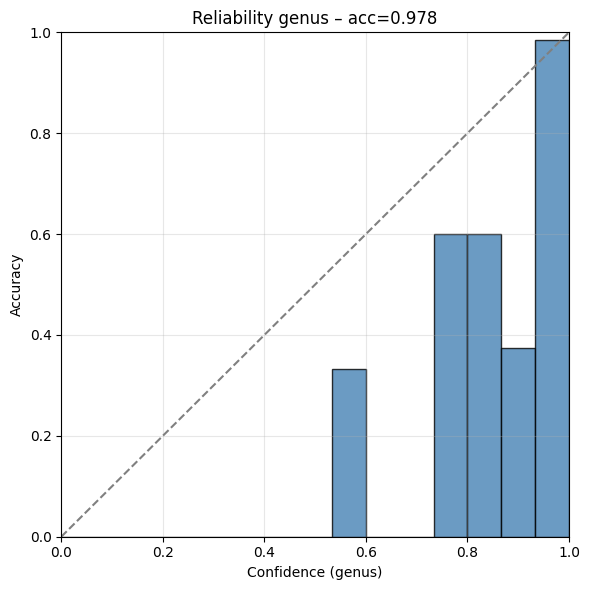

In [25]:
# chiamata calibrazione

# !! per eseguire questo serve eseguire prima le definizioni delle funzioni (e classi) sopra: test_loader, GenusTemperatureWrapper e plot_reliability_genus_safe !!

wrapper = calibrate_genus_temperature(model, val_loader, species_map)

# test identico
#metrics = test_model(wrapper, test_loader)
#print(metrics)

## funziona mettendo anche model = wrapper, infer l'ho definito anche in GenusTemperatureWrapper
#con l'eccezione che riscala i logits per T, la quale è stata precedentemente ottimizzata !! 

plot_reliability_genus_safe(wrapper, test_loader, species_map, n_bins=15) 